In [223]:
import json
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
from zipfile import ZipFile
file_name = 'drive/MyDrive/Colab Notebooks/side-chain-multiple-data-extended_no_padding.zip'

with ZipFile(file_name, 'r') as zip:
  zip.extractall()
  print('Done')

In [227]:
%cd ..

/Users/vladlenatrus/Downloads


In [6]:
from catboost import CatBoostClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import MultiLabelBinarizer

In [224]:
from torch.nn import LSTM, Conv2d, Linear, Dropout, Sequential, Module, MaxPool2d, AvgPool2d, Flatten, BCELoss, Sigmoid, ReLU, Dropout2d, Dropout
from torch import cat, Tensor, reshape
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader
import torch

In [228]:
with open('./side-chain-multiple-data-extended-pure_no_padding_LE/filenames.json') as json_file:
    data = json.load(json_file)

In [229]:
print('Train:=', len(data['train']))
print('Test:=', len(data['test']))
print('Validation:=', len(data['validation']))

Train:= 50098
Test:= 21456
Validation:= 10036


In [5]:
train_data = np.array([np.load(name.replace("*", "x"), allow_pickle = True) for name in data['train']])
train_y = np.array([np.load(name.replace("*", "y"), allow_pickle = True) for name in data['train']])

In [81]:
cat_0 = np.arange(20) # resname

In [82]:
cat_1 = np.arange(2) # polarity_group

In [83]:
cat_2 = np.arange(3) # hydropathy_group

In [84]:
cat_3 = np.arange(5) # volume_group

In [85]:
cat_4 = np.arange(7) # chemical_group

In [86]:
cat_5 = np.arange(11) # physicochemical_group

In [87]:
cat_6 = np.arange(3) # charge_group

In [88]:
cat_7 = np.arange(4) # hydrogen_donor_acceptor_group

In [89]:
cat_8 = np.arange(8) # sec struct (по DSSP)

In [90]:
cat_9 = np.arange(36) # phi

In [91]:
cat_10 = np.arange(36) # psi

In [232]:
class ProteinGenerator(Dataset):
    def __init__(self, filenames, transpose=False):
#         self._transpose = transpose
        self.filenames = filenames
        self.batch_size = 1
    
    def __len__(self):
        return (np.ceil(len(self.filenames) / float(self.batch_size))).astype(np.int)
    
    def __getitem__(self, idx):
        filenames = self.filenames[idx * self.batch_size:(idx+1) * self.batch_size]
        batch_x = np.array([np.load(name.replace("*", "x"), allow_pickle=True) for name in filenames])
        batch_x_cat = batch_x[0].T[0][:11].astype(np.int64)
        batch_x_cat[9] += 18
        batch_x_cat[10] += 18
        batch_x_num = batch_x[0].T[0][11:].astype(np.float32)
        batch_y = np.array([np.load(name.replace("*", "y")) for name in filenames])
        batch_y = batch_y[0]
        batch_x_cat = torch.tensor(batch_x_cat).to(torch.int64)
        return batch_x_cat, Tensor(batch_x_num), Tensor(batch_y)

In [233]:
train_set = ProteinGenerator(data["train"], transpose=False)
train_generator = DataLoader(train_set, 
                             batch_size=128, 
                             shuffle=True)

In [363]:
for i in train_set:
    a = i
    break

In [358]:
a[0].shape, a[1].shape, a[2].shape

(torch.Size([11, 64]), torch.Size([64, 64]), torch.Size([2304]))

In [12]:
ar_dims = np.array([20, 2, 3, 5, 7, 11, 3, 4, 8, 36, 36])
ar_dims

array([20,  2,  3,  5,  7, 11,  3,  4,  8, 36, 36])

In [13]:
embedding_sizes = []
for i in range(11):
    embedding_sizes.append((ar_dims[i], (ar_dims[i] + 1) // 2))

In [231]:
embedding_sizes

[(20, 10),
 (2, 1),
 (3, 2),
 (5, 3),
 (7, 4),
 (11, 6),
 (3, 2),
 (4, 2),
 (8, 4),
 (36, 18),
 (36, 18)]

In [234]:
from torch import nn

In [235]:
import torch.nn.functional as F

### Embeddings + Linear

In [236]:
class Net_lin_2(nn.Module):
    def __init__(self, embedding_sizes, n_cont = 64):
        super().__init__()
        self.embeddings = nn.ModuleList([nn.Embedding(categories, size) for categories,size in embedding_sizes])
        n_emb = sum(e.embedding_dim for e in self.embeddings) #length of all embeddings combined
        self.n_emb, self.n_cont = n_emb, n_cont
        self.lin1 = nn.Linear(self.n_emb, 128)
        self.lin2 = nn.Linear(128, 64)
        self.lin3 = nn.Linear(64, 36)
        self.bn2 = nn.BatchNorm1d(64)
        self.out = Sigmoid()
        

    def forward(self, x_cat, x_cont):
        x_temp = x_cat.permute(1, 2, 0)
        x = []
        for i, e in enumerate(self.embeddings):
            x.append(e(x_temp[i].T))
        x = torch.cat(x, 2)
        x = F.relu(self.lin1(x))
        x = self.bn2(x)
        x = F.relu(self.lin2(x))
        x = self.lin3(x)
        x = self.out(x)
        return x

In [237]:
model = Net_lin_2(embedding_sizes, 64)
optimizer = Adam(model.parameters())
loss_func = nn.BCELoss()
# model.load_state_dict(torch.load('nn_3_le.pth'))

<All keys matched successfully>

In [2]:
model.train()
for i in range(1):
    for x1, x2, y in train_generator:
        output = model(x1, x2)
        optimizer.zero_grad()
        pred_loss = loss_func(output, y.reshape(y.shape[0], 64, 36))
        pred_loss.backward()
        optimizer.step()
        print(pred_loss.item())

In [1]:
model.eval()
predictions = []
for x1, x2, y in test_generator:
    output = model(x1, x2)
    pred_loss = loss_func(output, y.reshape(y.shape[0], 64, 36))
    predictions.append(output)
    print(pred_loss.item())

In [266]:
def rotamer_accuracy(y_pred, y_true, rotamer_bin_radius=3):
    if len(y_pred.shape) > 2:
        y_pred = np.reshape(y_pred, (y_pred.shape[-2], y_pred.shape[-1]))
    if len(y_true.shape) > 2:
        y_true = np.reshape(y_true, (y_true.shape[-2], y_true.shape[-1]))
    
    pred_bins = np.argmax(y_pred, axis=1)
    orig_bins = np.argmax(y_true, axis=1)
#     print(type(pred_bins))
    r = pred_bins - orig_bins.numpy()
    dists = np.abs(r)
    # print(dists)
    dists = np.minimum(dists, 36 - dists)
    chi_present_mask = np.max(y_true.numpy(), axis=1) > 0
#     print(chi_present_mask)
    dists = dists[chi_present_mask]
    
    
    return np.sum(dists <= rotamer_bin_radius) / dists.shape[0]

In [245]:
def rotamer_accuracy_2(y_pred, y_true, rotamer_bin_radius=3):
    if len(y_pred.shape) > 2:
        y_pred = np.reshape(y_pred, (y_pred.shape[-2], y_pred.shape[-1]))
    if len(y_true.shape) > 2:
        y_true = np.reshape(y_true, (y_true.shape[-2], y_true.shape[-1]))
    
    pred_bins = np.argmax(y_pred, axis=1)
    orig_bins = np.argmax(y_true, axis=1)
    dists = np.abs(pred_bins - orig_bins)
    dists = np.minimum(dists, 36 - dists)
    y_true = y_true.numpy()
    chi_present_mask = np.max(y_true, axis=1) > 0 # 
    result = []
    for i in range(chi_present_mask.shape[0]):
        if chi_present_mask[i] == False:
            result.append(np.nan)
        else:
            if  (dists <= rotamer_bin_radius)[i] == True:
                result.append(1)
            else:
                result.append(0)
    return result

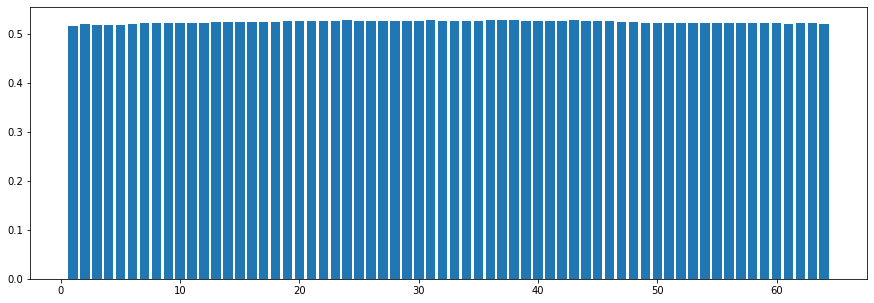

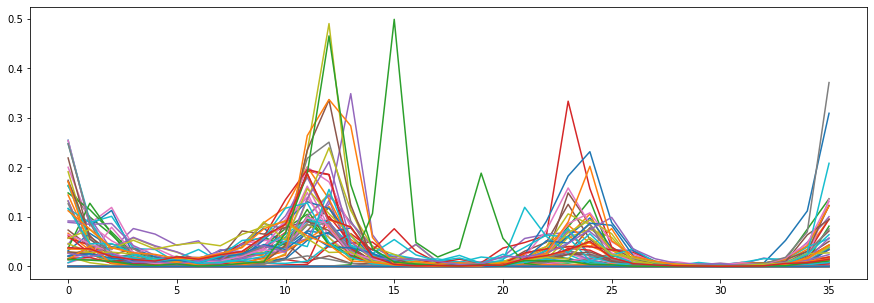

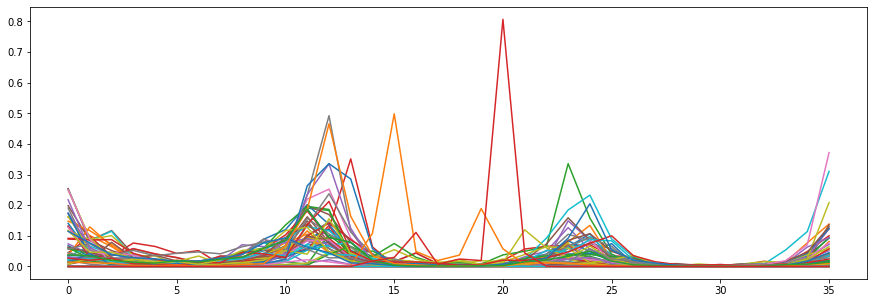

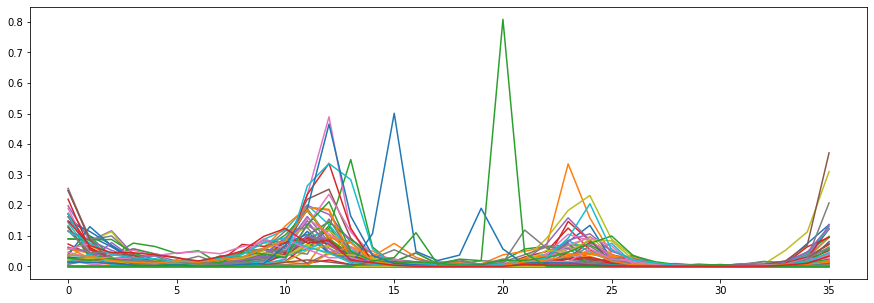

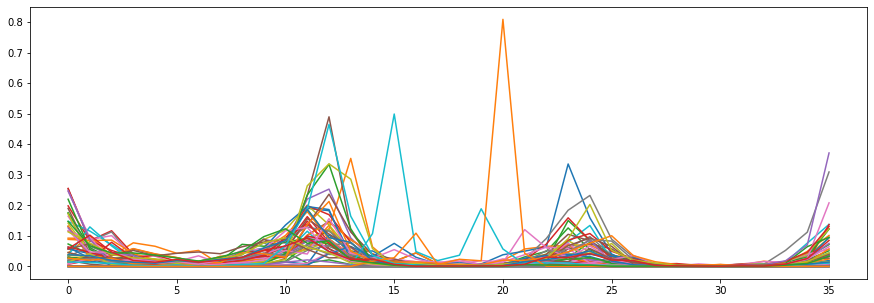

...

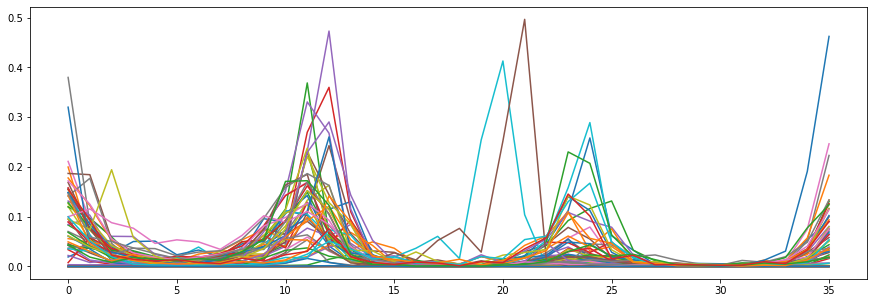

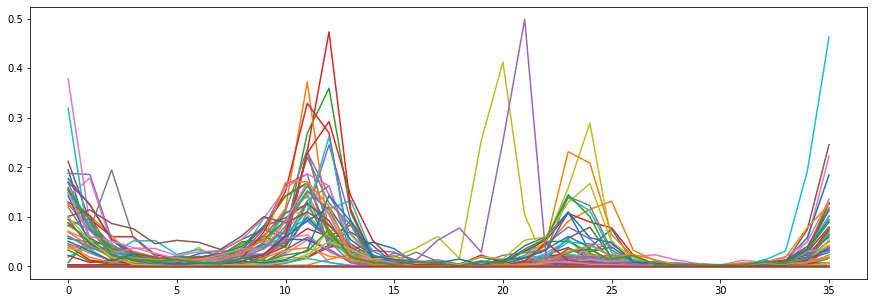

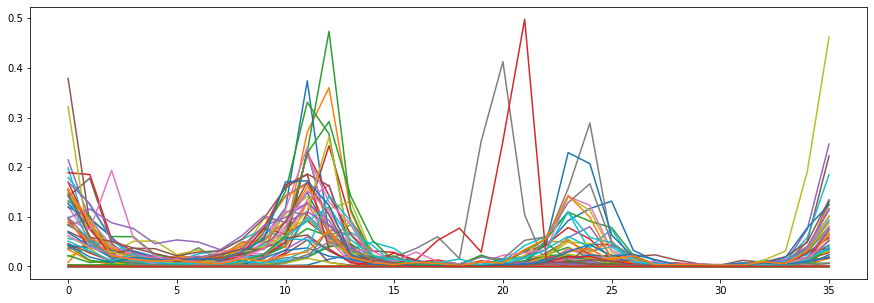

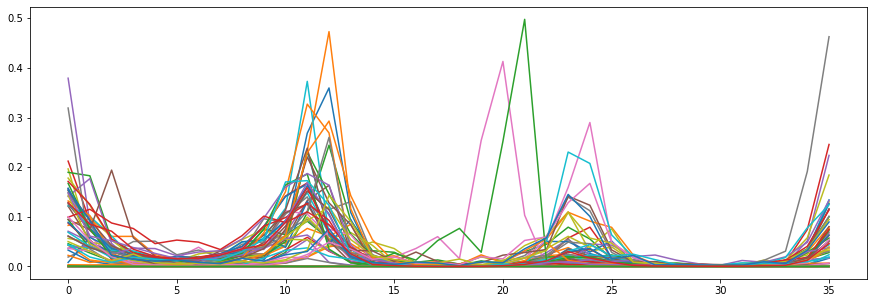

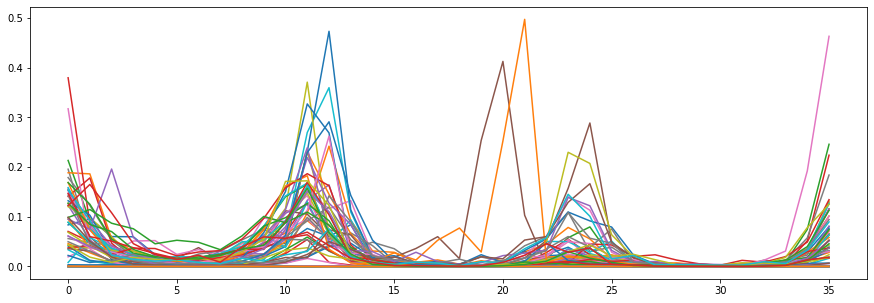

In [65]:
plt.figure(figsize=(15,5)) ########jdfjknbdfjknjkbdfkdfj
plt.bar(np.arange(1, 65), np.nansum(accs, axis=0)  / np.count_nonzero(~np.isnan(accs), axis=0))
# plt.savefig("accs_nans.png")
plt.show()
for j in range(100):
    plt.figure(figsize=(15,5))
    for i in range(64):
        plt.plot(np.arange(0, 36), predictions[j][0][i].detach().numpy())
    plt.show()

/Users/vladlenatrus/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in long_scalars


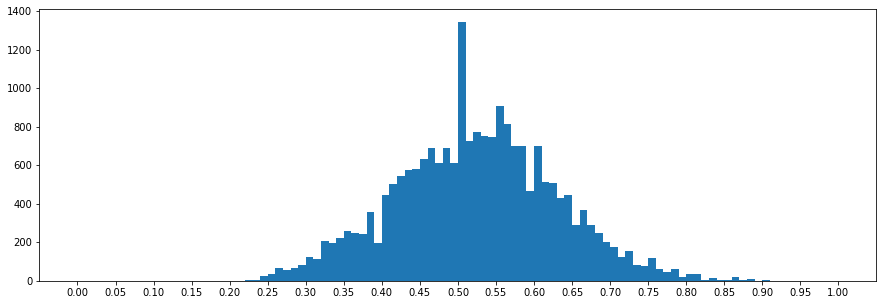

In [66]:
accs_2 = []  ###vdjksgdflkjfdgskj
# test_generator = ProteinGenerator(data["test"], transpose=False)
j = 0 
for i in test_generator:
    _, _,y_true = i
    y_pred = predictions[j]
    j += 1
    accs_2.append(rotamer_accuracy(y_pred.detach().numpy(), y_true.reshape(64, 36), rotamer_bin_radius=3))

plt.figure(figsize=(15,5))
plt.hist(accs_2, bins=100, range=(0,1))
plt.xticks(np.arange(0,1.05,0.05))
plt.savefig("accs_bn.png")
plt.show()

In [67]:
# torch.save(model.state_dict(), 'nn_3_le.pth')

/Users/vladlenatrus/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in long_scalars
/Users/vladlenatrus/.local/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/vladlenatrus/.local/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


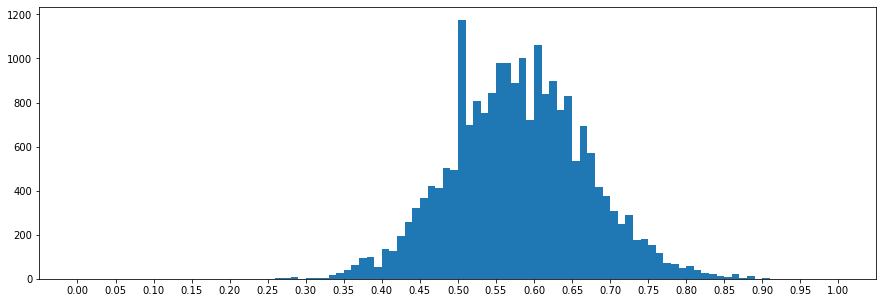

In [281]:
accs_2 = []  ###vdjksgdflkjfdgskj
# test_generator = ProteinGenerator(data["test"], transpose=False)
j = 0 
for i in test_generator:
    _, _,y_true = i
    y_pred = predictions[j]
    j += 1
    accs_2.append(rotamer_accuracy(y_pred.detach().numpy(), y_true.reshape(64, 36), rotamer_bin_radius=6))

plt.figure(figsize=(15,5))
plt.hist(accs_2, bins=100, range=(0,1))
plt.xticks(np.arange(0,1.05,0.05))
plt.savefig("accs_bn.png")
plt.show()